<a href="https://colab.research.google.com/github/tlaet/Inventory-Managament/blob/master/Ml_raw_material_forecast.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install catboost

In [ ]:
#Importação das bibliotecas
import os
import glob
import pandas as pd
import numpy as np
import xgboost as xgb
import matplotlib.pyplot as plt
from matplotlib.pyplot import rcParams
from IPython.display import display
from sklearn.metrics import mean_squared_log_error
from sklearn.ensemble import RandomForestRegressor
from lightgbm import LGBMRegressor
from sklearn.model_selection import train_test_split
import sklearn.model_selection as model_selection
from sklearn import datasets, linear_model
from sklearn.metrics import mean_squared_log_error
from sklearn.ensemble import RandomForestRegressor
from lightgbm import LGBMRegressor
from xgboost import XGBClassifier
from xgboost import XGBRegressor
from sklearn import datasets
from sklearn.linear_model import LinearRegression
from sklearn.externals import joblib
from sklearn.metrics import precision_score
from sklearn.metrics import mean_squared_error
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode, iplot
from sklearn.preprocessing import LabelEncoder
from catboost import CatBoostRegressor
import seaborn as sns

/usr/local/lib/python3.7/dist-packages/sklearn/externals/joblib/__init__.py:15: FutureWarning: sklearn.externals.joblib is deprecated in 0.21 and will be removed in 0.23. Please import this functionality directly from joblib, which can be installed with: pip install joblib. If this warning is raised when loading pickled models, you may need to re-serialize those models with scikit-learn 0.21+.
  warnings.warn(msg, category=FutureWarning)


In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
path = r'/content/gdrive/MyDrive/04. Personal projects/94.data science/dasa_forecast/data' # use your path
all_files = glob.glob(path + "/*.csv")

li = []

for filename in all_files:
    df = pd.read_csv(filename,encoding='latin-1',decimal=',', usecols = ['Texto breve de material',
                                                             'Material',
                                                             'Nome 1',
                                                             'Centro',
                                                             'Data de lançamento',
                                                             'Qtd.  UM registro',                                                
                                                             'Tipo de movimento'
                                                            ], sep=';',index_col=None, header=0)
    li.append(df)

frame = pd.concat(li, axis=0, ignore_index=True)

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning:

Columns (4) have mixed types.Specify dtype option on import or set low_memory=False.



**2 - Análise Exploratória dos dados -  EDA**

In [ ]:
frame.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1634143 entries, 0 to 1634142
Data columns (total 7 columns):
 #   Column                   Non-Null Count    Dtype  
---  ------                   --------------    -----  
 0   Material                 1634143 non-null  int64  
 1   Texto breve de material  1634143 non-null  object 
 2   Centro                   1634143 non-null  object 
 3   Nome 1                   1634143 non-null  object 
 4   Tipo de movimento        1634143 non-null  object 
 5   Data de lançamento       1634143 non-null  object 
 6   Qtd.  UM registro        1634143 non-null  float64
dtypes: float64(1), int64(1), object(5)
memory usage: 87.3+ MB


In [ ]:
frame.isna().sum()

Material                   0
Texto breve de material    0
Centro                     0
Nome 1                     0
Tipo de movimento          0
Data de lançamento         0
Qtd.  UM registro          0
dtype: int64

In [ ]:
frame.head()

,Material,Texto breve de material,Centro,Nome 1,Tipo de movimento,Data de lançamento,Qtd. UM registro
0,10000104,SOL PROCELL 2X2L E170 ROCHE,D043,ARMAZEM-SP,101,23/06/2020,150.0
1,10000104,SOL PROCELL 2X2L E170 ROCHE,D043,ARMAZEM-SP,101,18/06/2020,3.0
2,10000104,SOL PROCELL 2X2L E170 ROCHE,D043,ARMAZEM-SP,101,16/06/2020,247.0
3,10000104,SOL PROCELL 2X2L E170 ROCHE,D043,ARMAZEM-SP,101,15/06/2020,60.0
4,10000104,SOL PROCELL 2X2L E170 ROCHE,D043,ARMAZEM-SP,101,03/04/2020,567.0


In [ ]:
frame["Qtd.  UM registro"] = abs(frame["Qtd.  UM registro"])
frame.rename(columns={'Qtd.  UM registro': 'Consumo'},inplace=True)

frame["Tipo de movimento"] = frame["Tipo de movimento"].astype("string")
frame.rename(columns={'Tipo de movimento': 'Movimento'},inplace=True)

frame["Texto breve de material"] = frame["Texto breve de material"].astype("string")
frame.rename(columns={'Texto breve de material': 'Descricao'},inplace=True)

frame["Material"] = frame["Material"].astype("string")
frame.rename(columns={'Material': 'Sku'},inplace=True)

frame["Nome 1"] = frame["Nome 1"].astype("string")
frame.rename(columns={'Nome 1': 'Nome'},inplace=True)

frame['Data de lançamento'] = pd.to_datetime(frame['Data de lançamento'])
frame.rename(columns={'Data de lançamento': 'Data'},inplace=True)

frame["Sku"] = frame["Sku"].astype("int64")

In [ ]:
#label_encoder = LabelEncoder()

In [ ]:
#https://minerandodados.com.br/one-hot-encoding-como-funciona-python/
#frame.Centro = label_encoder.fit_transform(frame.Centro)

In [ ]:
frame = frame.drop(frame[(frame['Movimento'] == "101")].index)
frame = frame.drop(frame[(frame['Movimento'] == "102")].index)
frame = frame.drop(frame[(frame['Movimento'] == "122")].index)
frame = frame.drop(frame[(frame['Movimento'] == "161")].index)
frame = frame.drop(frame[(frame['Movimento'] == "162")].index)
frame = frame.drop(frame[(frame['Movimento'] == "301")].index)
frame = frame.drop(frame[(frame['Movimento'] == "302")].index)
frame = frame.drop(frame[(frame['Movimento'] == "303")].index)
frame = frame.drop(frame[(frame['Movimento'] == "309")].index)
frame = frame.drop(frame[(frame['Movimento'] == "311")].index)
frame = frame.drop(frame[(frame['Movimento'] == "312")].index)
frame = frame.drop(frame[(frame['Movimento'] == "325")].index)
frame = frame.drop(frame[(frame['Movimento'] == "343")].index)
frame = frame.drop(frame[(frame['Movimento'] == "344")].index)
frame = frame.drop(frame[(frame['Movimento'] == "561")].index)
frame = frame.drop(frame[(frame['Movimento'] == "711")].index)
frame = frame.drop(frame[(frame['Movimento'] == "712")].index)
frame = frame.drop(frame[(frame['Movimento'] == "717")].index)
frame = frame.drop(frame[(frame['Movimento'] == "718")].index)
frame = frame.drop(frame[(frame['Movimento'] == "901")].index)
frame = frame.drop(frame[(frame['Movimento'] == "902")].index)
frame = frame.drop(frame[(frame['Movimento'] == "903")].index)
frame = frame.drop(frame[(frame['Movimento'] == "904")].index)
frame = frame.drop(frame[(frame['Movimento'] == "905")].index)
frame = frame.drop(frame[(frame['Movimento'] == "906")].index)

In [ ]:
def expand(frame,date_col):
    frame['year'] = frame[date_col].dt.year
    frame['month'] = frame[date_col].dt.month
    frame['day'] = frame[date_col].dt.day
    frame['dayofweek'] = frame[date_col].dt.dayofweek
    frame['weekofyear'] = frame[date_col].dt.weekofyear
    frame['dayofyear'] = frame[date_col].dt.dayofyear

In [ ]:
expand(frame,'Data')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning:

Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.



In [ ]:
df = frame.groupby(['Centro','Sku','day','dayofweek','weekofyear','dayofyear','month','year'])[['Consumo']].sum().reset_index()

In [ ]:
df.Sku.value_counts()

10008747    21599
10007898    21423
10005411    18532
10003052    16931
10009724    10849
            ...  
10017464        1
10017075        1
10015497        1
10006846        1
10003369        1
Name: Sku, Length: 932, dtype: int64

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



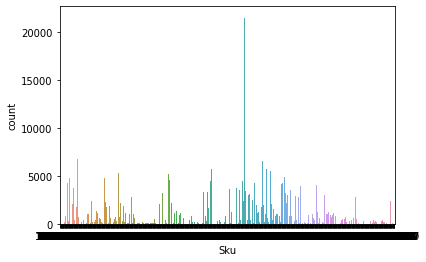

In [ ]:
sns.countplot(df.Sku)

In [ ]:
df.Centro.value_counts()

D474    147975
D386     97210
D491     93699
D043     62478
D044     42631
         ...  
P018         1
D018         1
D225         1
DC22         1
D473         1
Name: Centro, Length: 332, dtype: int64

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



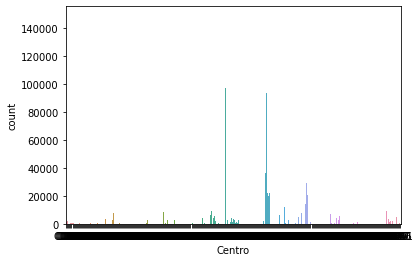

In [ ]:
sns.countplot(df.Centro)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



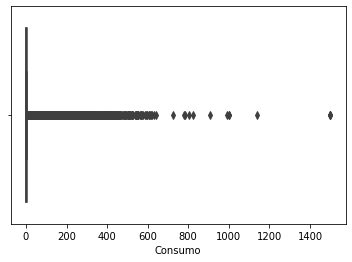

In [ ]:
sns.boxplot(df.Consumo)

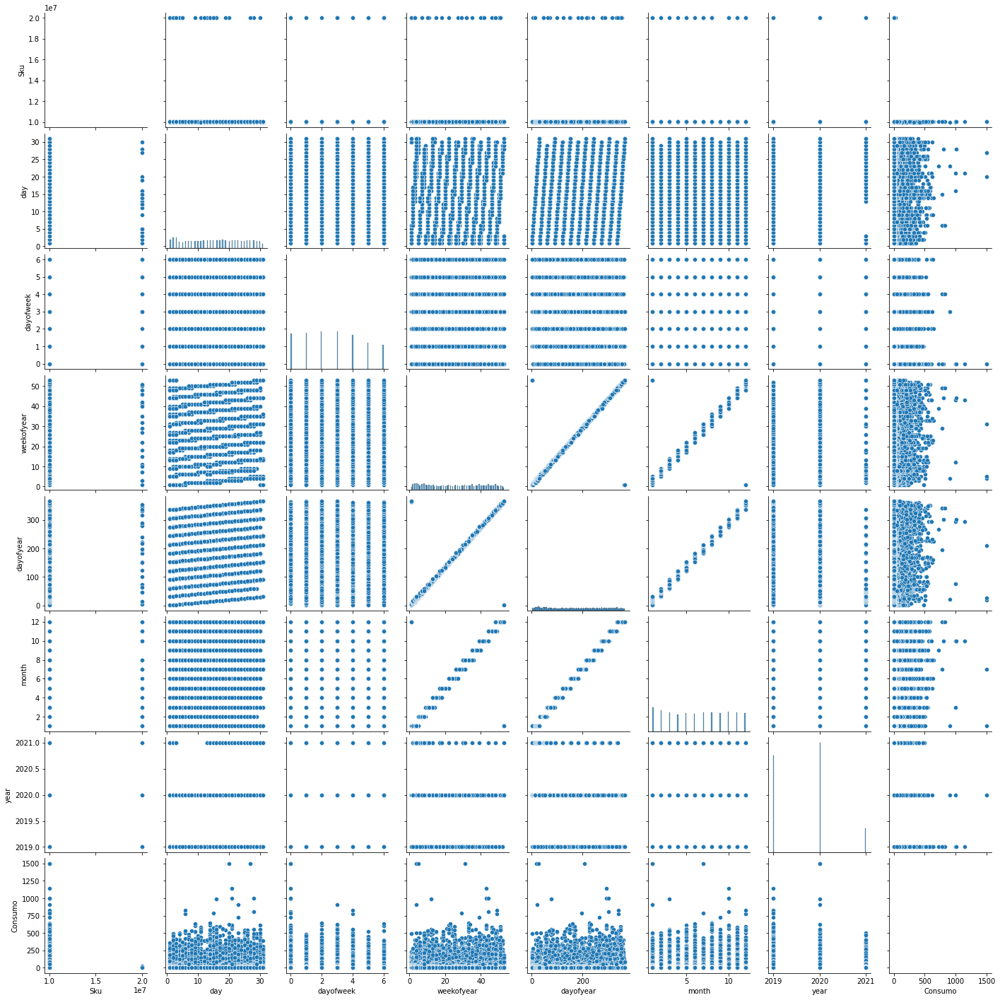

In [ ]:
sns.pairplot(df)

 **EDA**

In [ ]:
daily_sales = frame.groupby('Data', as_index=False)['Consumo'].sum()
store_daily_sales = frame.groupby(['Centro', 'Data'], as_index=False)['Consumo'].sum()
item_daily_sales = frame.groupby(['Sku', 'Data'], as_index=False)['Consumo'].sum()

In [ ]:
daily_sales_sc = go.Scatter(x=daily_sales['Data'], y=daily_sales['Consumo'])
layout = go.Layout(title='Daily Consumption', xaxis=dict(title='Data'), yaxis=dict(title='Consumo'))
fig = go.Figure(data=[daily_sales_sc], layout=layout)
iplot(fig)

In [ ]:
store_daily_sales_sc = []
for store in store_daily_sales['Centro'].unique():
    current_store_daily_sales = store_daily_sales[(store_daily_sales['Centro'] == store)]
    store_daily_sales_sc.append(go.Scatter(x=current_store_daily_sales['Data'], y=current_store_daily_sales['Consumo'], name=('Store %s' % store)))

layout = go.Layout(title='Consumo Diário por Centro', xaxis=dict(title='Data'), yaxis=dict(title='Consumo'))
fig = go.Figure(data=store_daily_sales_sc, layout=layout)
iplot(fig)

In [ ]:
item_daily_sales_sc = []
for item in item_daily_sales['Sku'].unique():
    current_item_daily_sales = item_daily_sales[(item_daily_sales['Sku'] == item)]
    item_daily_sales_sc.append(go.Scatter(x=current_item_daily_sales['Data'], y=current_item_daily_sales['Consumo'], name=('Sku %s' % item)))

layout = go.Layout(title='Consumo diário por sku', xaxis=dict(title='Date'), yaxis=dict(title='Sales'))
fig = go.Figure(data=item_daily_sales_sc, layout=layout)
iplot(fig)

**Preprocessing**

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(df.drop('Consumo',
                                                    axis=1),
                                                    df['Consumo'],
                                                    test_size=0.3,
                                                    random_state=100)

categorical_features_indices = np.where(df.dtypes !=np.float)[0]

print ("X_train: ", X_train)
print ("y_train: ", y_train)
print("X_test: ", X_test)
print ("y_test: ", y_test)

In [ ]:
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(631274, 8) (270547, 8) (631274,) (270547,)


In [ ]:
model = CatBoostRegressor(iterations=200,depth=3,learning_rate=0.1, loss_function="RMSE")

model.fit(X_train, y_train, 
          categorical_features_indices,
          eval_set=(X_test, y_test),plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 15.5533488	test: 15.2224735	best: 15.2224735 (0)	total: 836ms	remaining: 2m 46s
1:	learn: 15.3340831	test: 14.9807695	best: 14.9807695 (1)	total: 1.56s	remaining: 2m 34s
2:	learn: 15.1556711	test: 14.7848846	best: 14.7848846 (2)	total: 1.85s	remaining: 2m 1s
3:	learn: 15.0088320	test: 14.6342825	best: 14.6342825 (3)	total: 2.11s	remaining: 1m 43s
4:	learn: 14.8884680	test: 14.5093935	best: 14.5093935 (4)	total: 2.35s	remaining: 1m 31s
5:	learn: 14.7782987	test: 14.3808609	best: 14.3808609 (5)	total: 2.61s	remaining: 1m 24s
6:	learn: 14.6836990	test: 14.2774940	best: 14.2774940 (6)	total: 2.9s	remaining: 1m 19s
7:	learn: 14.6035931	test: 14.1910528	best: 14.1910528 (7)	total: 3.16s	remaining: 1m 15s
8:	learn: 14.5299545	test: 14.1109645	best: 14.1109645 (8)	total: 3.4s	remaining: 1m 12s
9:	learn: 14.4697408	test: 14.0460486	best: 14.0460486 (9)	total: 3.66s	remaining: 1m 9s
10:	learn: 14.4165070	test: 13.9839016	best: 13.9839016 (10)	total: 3.9s	remaining: 1m 6s
11:	learn: 14.

In [ ]:
print(model.get_best_iteration())

49


In [ ]:
submissao = pd.DataFrame()

submissao['Centro'] = df['Centro']
submissao['Sku'] = df['Sku']
submissao['month'] = df['month']
submissao['day'] = df['day']
submissao['Consumo'] = model.predict(df)
submissao

,Centro,Sku,month,day,Consumo
0,0,10000130,2,4,0.951882
1,0,10000130,2,26,3.969278
2,0,10000130,12,29,0.816226
3,0,10000130,9,30,6.081245
4,0,10000148,1,27,0.878046
...,...,...,...,...,...
901816,342,10013850,10,7,4.777725
901817,342,10013850,7,8,5.598753
901818,342,10013850,9,16,5.992279
901819,342,10013850,2,21,7.319642


In [ ]:
submissao.to_csv(r'C:\Users\thars\Desktop\export_dataframe.csv',sep=';', index = False, header=True)